1. Implement the intensity transformation depicted in Fig. 1a on the image shown in Fig. 1b.
In OpenCV, intensity transformation means applying a function s=T(r) to each pixel value of an image.
You can do this in a few ways depending on the transformation type:

In [1]:
import cv2
import numpy as np
import matplotlib.pyplot as plt


In [4]:
# Read gray scale image
img = cv2.imread(r'D:\5th sem\Image proccessing\EN3160-Assignment-1---Intensity-Transformations-and-Neighborhood-Filtering\a1images\emma.jpg', 0)

# Prepare output
output = np.zeros_like(img, dtype=np.float32)

In [5]:
# for section one - linear transformation with unit gradient
section1 = img < 50
output[section1] = img[section1]
#section 2 
section2= (img >= 50) & (img < 150)
output[section2]= (15.5 * img[section2]) + 50
# for section three - linear transformation with unit gradient
section3 = (img >= 150) & (img < 255)
output[section3]= img[section3]

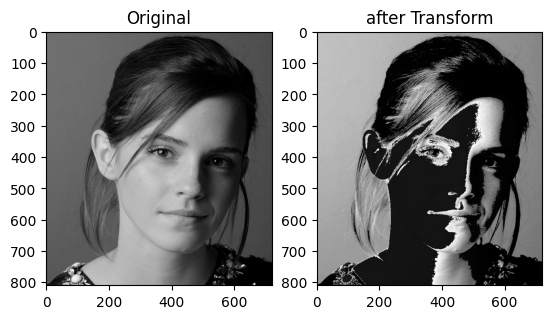

In [9]:
plt.subplot(1, 2, 1), plt.imshow(img,cmap="gray"), plt.title('Original')
plt.subplot(1, 2, 2), plt.imshow(output,cmap="gray"), plt.title('after Transform')
plt.show()

 2. Apply a similar operation as above (question 1) to accentuate
 (a) white matter
 (b) gray matter

White Matter (WM) appears brighter in T1-weighted MRI (high intensity values).
Gray Matter (GM) appears darker than WM but brighter than CSF (medium intensity values).

We can threshold or remap these intensity ranges to make them stand out.

Binary masks (same size as the image) where:
- 255 = keep this pixel (belongs to WM or GM)
- 0 = discard this pixel (doesn’t belong to that tissue)

In [60]:
# Read MRI in grayscale
img2 = cv2.imread(r'D:\5th sem\Image proccessing\EN3160-Assignment-1---Intensity-Transformations-and-Neighborhood-Filtering\a1images\brain_proton_density_slice.png', 0)

# Normalize image for consistent scaling to the range 0-255
img_norm = cv2.normalize(img2, None, 0, 255, cv2.NORM_MINMAX)

# White Matter mask (bright intensities, e.g., 180–255)
wm_mask = cv2.inRange(img_norm, 180, 255)

# Gray Matter mask (medium intensities, e.g., 100–179)
gm_mask = cv2.inRange(img_norm, 100, 179)

The mask determines which output pixels are calculated and which are set to zero.
- Only pixels where mask = 255 are taken from (img_norm & img_norm).
- All other positions become black (intensity 0).

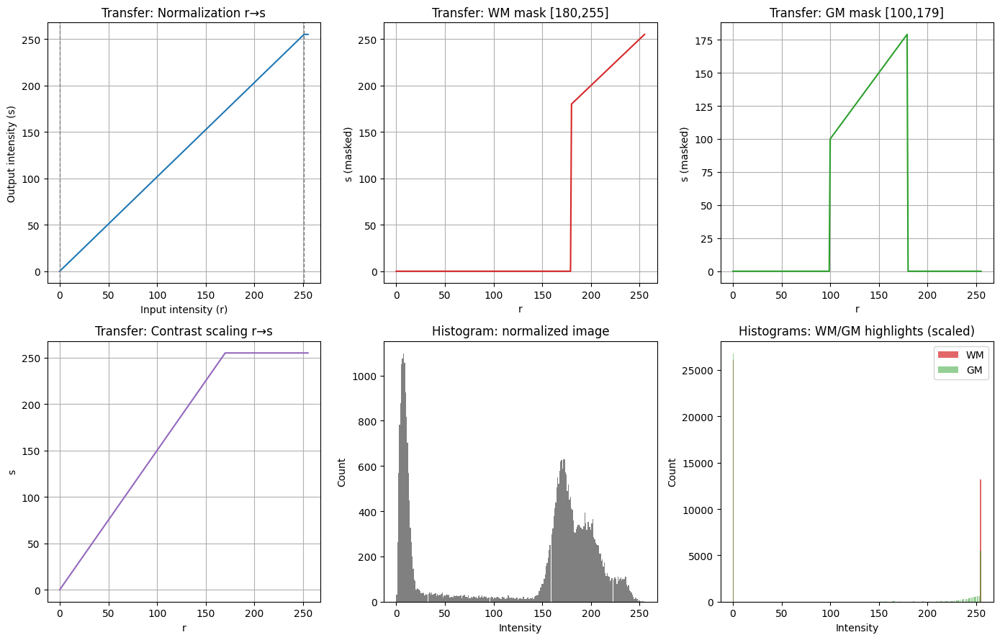

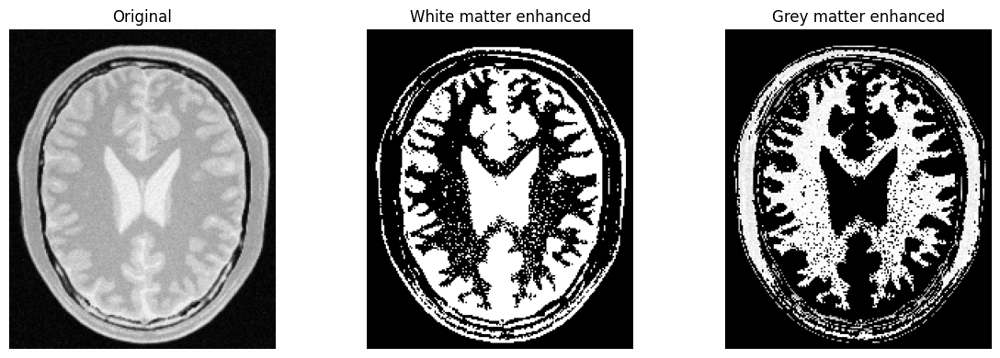

In [61]:
# Apply masks (accentuate by making them brighter)
wm_highlight = cv2.bitwise_and(img_norm, img_norm, mask=wm_mask)
gm_highlight = cv2.bitwise_and(img_norm, img_norm, mask=gm_mask)

# Optionally enhance contrast
wm_highlight = cv2.convertScaleAbs(wm_highlight, alpha=1.5, beta=0)
gm_highlight = cv2.convertScaleAbs(gm_highlight, alpha=1.5, beta=0)

# 1) Plot transfer functions (r -> s)
# a) Normalization transfer function (min-max on the original image)
r_min, r_max = int(img2.min()), int(img2.max())
r = np.arange(0, 256)
# Map only the effective range linearly; outside it, clamp
norm_s = np.interp(r, [r_min, r_max], [0, 255])
norm_s = np.clip(norm_s, 0, 255)

# Threshold ranges
wm_low, wm_high = 180, 255
gm_low, gm_high = 100, 179
alpha, beta = 1.5, 0

# b) Threshold masks as piecewise mappings (binary masks)
# For masks, output indicates "kept intensity" after masking (others 0)
wm_tf = np.where((r >= wm_low) & (r <= wm_high), r, 0)
gm_tf = np.where((r >= gm_low) & (r <= gm_high), r, 0)

# c) Contrast scaling transfer on already-masked intensities: s = clip(alpha*r + beta)
scale_tf = np.clip(alpha * r + beta, 0, 255)

plt.figure(figsize=(14, 9))

# Transfer functions
plt.subplot(2, 3, 1)
plt.plot(r, norm_s, label='Normalization (min-max)')
plt.axvline(r_min, color='gray', linestyle='--', linewidth=1)
plt.axvline(r_max, color='gray', linestyle='--', linewidth=1)
plt.title('Transfer: Normalization r→s')
plt.xlabel('Input intensity (r)')
plt.ylabel('Output intensity (s)')
plt.grid(True)

plt.subplot(2, 3, 2)
plt.plot(r, wm_tf, color='tab:red', label='WM mask')
plt.title(f'Transfer: WM mask [{wm_low},{wm_high}]')
plt.xlabel('r')
plt.ylabel('s (masked)')
plt.grid(True)

plt.subplot(2, 3, 3)
plt.plot(r, gm_tf, color='tab:green', label='GM mask')
plt.title(f'Transfer: GM mask [{gm_low},{gm_high}]')
plt.xlabel('r')
plt.ylabel('s (masked)')
plt.grid(True)

plt.subplot(2, 3, 4)
plt.plot(r, scale_tf, color='tab:purple', label=f's = {alpha}·r + {beta}')
plt.title('Transfer: Contrast scaling r→s')
plt.xlabel('r')
plt.ylabel('s')
plt.grid(True)

# 2) Histograms to visualize distributions pre/post
plt.subplot(2, 3, 5)
plt.hist(img_norm.ravel(), bins=256, range=(0,255), color='gray')
plt.title('Histogram: normalized image')
plt.xlabel('Intensity'); plt.ylabel('Count')

plt.subplot(2, 3, 6)
plt.hist(wm_highlight.ravel(), bins=256, range=(0,255), color='tab:red', alpha=0.7, label='WM')
plt.hist(gm_highlight.ravel(), bins=256, range=(0,255), color='tab:green', alpha=0.5, label='GM')
plt.title('Histograms: WM/GM highlights (scaled)')
plt.xlabel('Intensity'); plt.ylabel('Count')
plt.legend()

plt.tight_layout()
plt.show()

# 3) Optional: show images for reference (already in your code)
plt.figure(figsize=(12,4))
plt.subplot(1,3,1); plt.imshow(img2, cmap='gray'); plt.title('Original'); plt.axis('off')
plt.subplot(1,3,2); plt.imshow(wm_highlight, cmap='gray'); plt.title('White matter enhanced'); plt.axis('off')
plt.subplot(1,3,3); plt.imshow(gm_highlight, cmap='gray'); plt.title('Grey matter enhanced'); plt.axis('off')
plt.tight_layout()
plt.show()


#### Q3 
(a) Apply gamma correction to the L plane in the L∗a∗b∗ color space and state the γ value.
(b) Show the histograms of the original and corrected images.

what is gamma correction? 
Gamma correction is a nonlinear operation used to encode and decode luminance or tristimulus values in images. It adjusts the brightness of an image to better match human perception or display characteristics.

What does it do?
- It changes the brightness of an image by applying a power-law transformation to each pixel’s intensity value.
- Helps to correct the brightness when images are displayed on different devices (monitors, cameras, etc.).
- It can brighten or darken an image depending on the gamma value.

The formula
\[
s = c \cdot r^{\gamma}
\]

Where:

- \( r \) = input pixel intensity normalized between 0 and 1  
- \( s \) = output pixel intensity  
- \( gamma \) = gamma value (a positive real number)  
- \( c \) = constant (usually 1 or 255 if working with 8-bit images)  



#### What is the **L\*a\*b\*** Color Space?

- The **L\*a\*b\*** (CIELAB) color space is designed to be **perceptually uniform** — meaning changes in values correspond more closely to how humans perceive color differences.
- It separates **lightness** from **color** information, which makes it very useful for image processing tasks.

---

#### Explanation of the Channels

| Channel | Description                    | Range                              | Represents                           |
|---------|--------------------------------|----------------------------------|------------------------------------|
| **L**   | **Lightness**                  | 0 (black) to 100 (white) in theory, but OpenCV scales it to 0–255 | How light or dark the pixel is (brightness) |
| **a**   | Green–Red color component      | Typically -128 to 127, scaled to 0–255 in OpenCV                   | Color axis from green (-) to red (+)          |
| **b**   | Blue–Yellow color component     | Typically -128 to 127, scaled to 0–255 in OpenCV                   | Color axis from blue (-) to yellow (+)        |

---

#### Why Apply Gamma Correction **Only** on the **L Channel**?

- **Gamma correction** adjusts the **brightness** or **luminance** of an image.  
- The **L channel** contains the **lightness (brightness)** information separated from color — so it makes sense to apply brightness adjustments there.  
- Applying gamma correction on **a** or **b** channels (which represent color) would distort color hues and make the image look unnatural.  
- By working on the L channel only, you **brighten or darken the image** while preserving the original colors.

---

In [15]:
# Convert your image from BGR (default in OpenCV) to Lab color space

# Read the image
img3 = cv2.imread(r'D:\5th sem\Image proccessing\EN3160-Assignment-1---Intensity-Transformations-and-Neighborhood-Filtering\a1images\highlights_and_shadows.jpg')

# Convert BGR to Lab
lab_img = cv2.cvtColor(img3, cv2.COLOR_BGR2LAB)

In [16]:
# Split the Lab image into L, a, b channels
L, a, b = cv2.split(lab_img)

#Normalize only L channel to [0,1] for gamma correction
L_norm = L / 255.0

In [17]:
# choose the gamma value = 2.2
gamma = 2.2
L_gamma = np.power(L_norm, gamma)

L_corrected = np.uint8(L_gamma * 255)
lab_corrected = cv2.merge((L_corrected, a, b)) #merge
result = cv2.cvtColor(lab_corrected, cv2.COLOR_LAB2BGR)

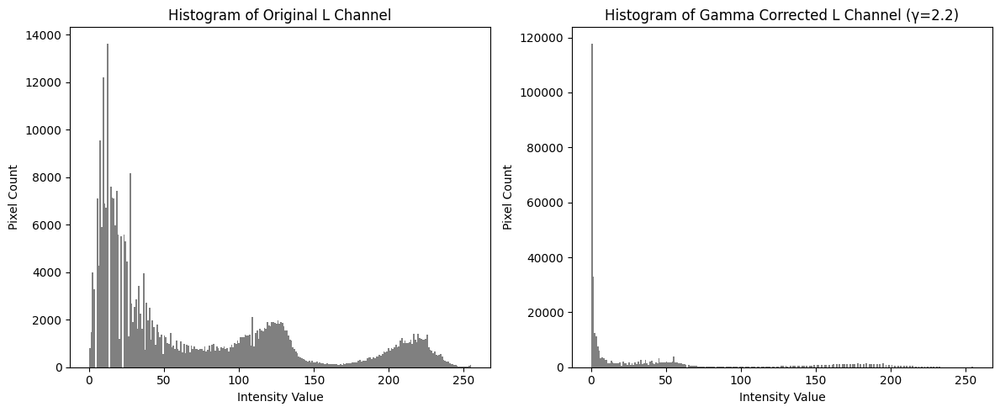

In [18]:
# plot the results

plt.figure(figsize=(12,5))

plt.subplot(1,2,1)
plt.hist(L.ravel(), bins=256, range=[0,255], color='gray')
plt.title('Histogram of Original L Channel')
plt.xlabel('Intensity Value')
plt.ylabel('Pixel Count')

plt.subplot(1,2,2)
plt.hist(L_corrected.ravel(), bins=256, range=[0,255], color='gray')
plt.title('Histogram of Gamma Corrected L Channel (γ=2.2)')
plt.xlabel('Intensity Value')
plt.ylabel('Pixel Count')

plt.tight_layout()
plt.show()


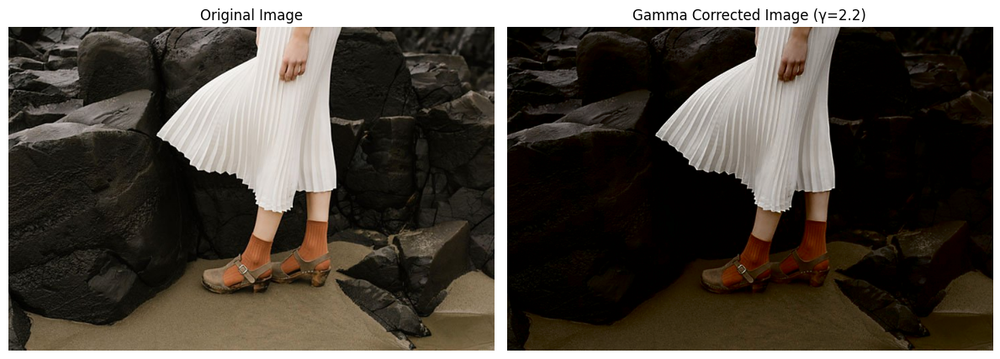

In [19]:
# Convert BGR to RGB for displaying correctly in matplotlib
img_rgb = cv2.cvtColor(img3, cv2.COLOR_BGR2RGB)
result_rgb = cv2.cvtColor(result, cv2.COLOR_BGR2RGB)

# Plot side by side
fig, axes = plt.subplots(1, 2, figsize=(12, 6))

axes[0].imshow(img_rgb)
axes[0].set_title('Original Image')
axes[0].axis('off')  # Hide axis ticks

axes[1].imshow(result_rgb)
axes[1].set_title(f'Gamma Corrected Image (γ={gamma})')
axes[1].axis('off')

plt.tight_layout()
plt.show()


#### Q4

In [34]:
# Read the image in BGR format (default for OpenCV)
img4 = cv2.imread(r'D:\5th sem\Image proccessing\EN3160-Assignment-1---Intensity-Transformations-and-Neighborhood-Filtering\a1images\spider.png')

# Convert the image from BGR to HSV color space
hsv_img = cv2.cvtColor(img4, cv2.COLOR_BGR2HSV)

# Split the HSV image into individual channels
h, s, v = cv2.split(hsv_img)

# Now, h, s, and v are the Hue, Saturation, and Value planes respectively


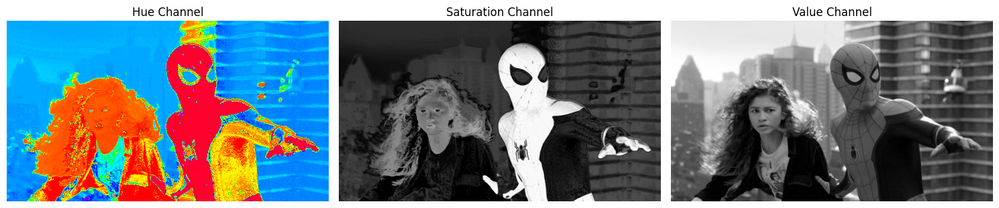

In [35]:
fig, axes = plt.subplots(1, 3, figsize=(15, 5))

axes[0].imshow(h, cmap='hsv')  # Hue channel, using HSV colormap for better color display
axes[0].set_title('Hue Channel')
axes[0].axis('off')

axes[1].imshow(s, cmap='gray')  # Saturation channel in grayscale
axes[1].set_title('Saturation Channel')
axes[1].axis('off')

axes[2].imshow(v, cmap='gray')  # Value channel in grayscale
axes[2].set_title('Value Channel')
axes[2].axis('off')

plt.tight_layout()
plt.show()

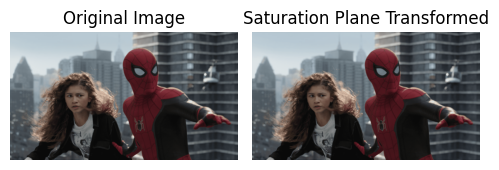

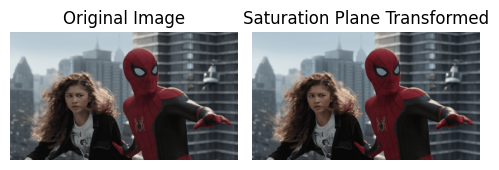

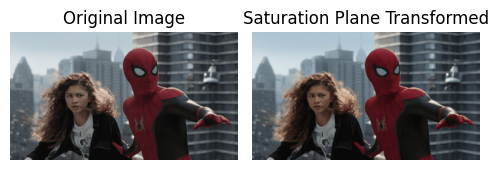

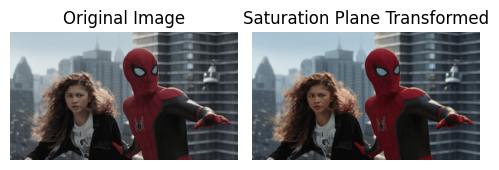

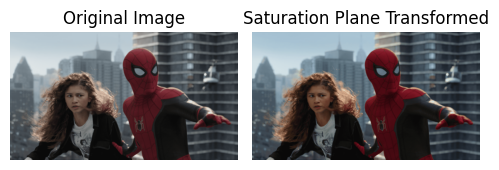

...

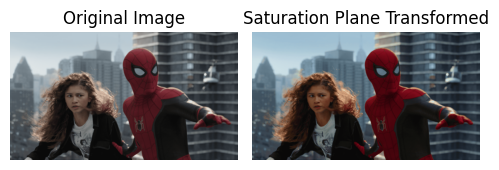

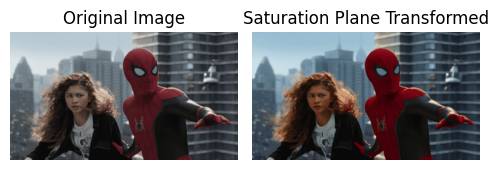

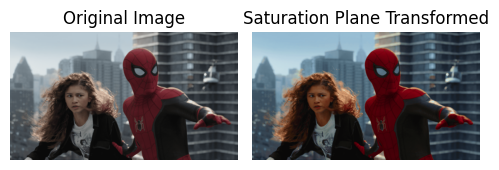

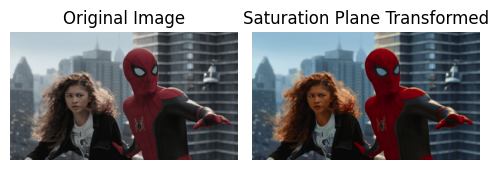

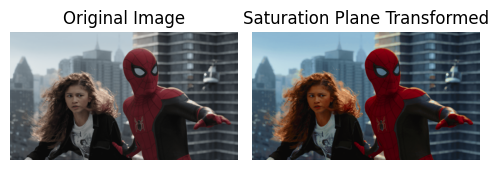

In [ ]:
# Parameters
a = [0,0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9,1]     
sigma = 70.0   


for i in a:
    # Calculate the Gaussian term
    gaussian_term = i * 128 * np.exp(-((s.astype(np.float32) - 128) ** 2) / (2 * (sigma ** 2)))

    # Apply the function f(x) = min(x + gaussian_term, 255)
    s_transformed = s.astype(np.float32) + gaussian_term
    s_transformed = np.clip(s_transformed, 0, 255).astype(np.uint8) # converts the saturation channel from integer to float for precise calculations.

    # Recombine three channels
    hsv_transformed = cv2.merge([h, s_transformed, v])

    # Convert back to BGR to display
    result = cv2.cvtColor(hsv_transformed, cv2.COLOR_HSV2BGR)

    # Show original and transformed images side by side
    fig, axes = plt.subplots(1, 2, figsize=(5, 3))
    axes[0].imshow(cv2.cvtColor(img4, cv2.COLOR_BGR2RGB))
    axes[0].set_title('Original Image')
    axes[0].axis('off')

    axes[1].imshow(cv2.cvtColor(result, cv2.COLOR_BGR2RGB))
    axes[1].set_title('Saturation Plane Transformed')
    axes[1].axis('off')

    plt.tight_layout()
    plt.show()




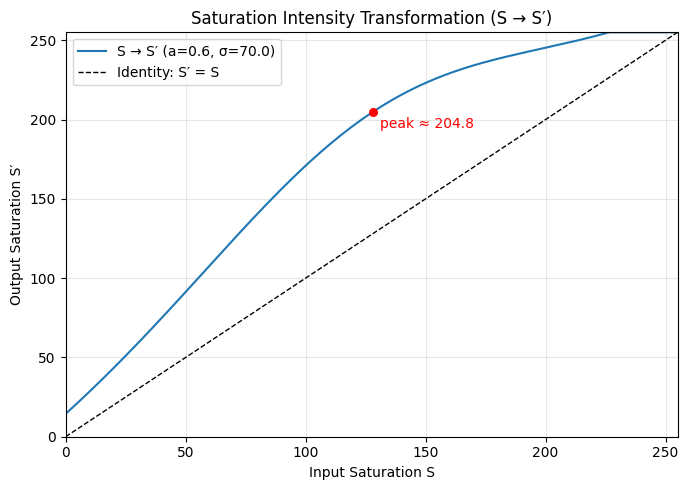

In [20]:
# Parameters
sigma = 70.0
a = 0.6

# Input saturation values (0..255)
S = np.arange(0, 256, dtype=np.float32)

# Gaussian term and transformed saturation
gaussian_term = a * 128.0 * np.exp(-((S - 128.0) ** 2) / (2.0 * (sigma ** 2)))
S_prime = np.clip(S + gaussian_term, 0, 255)

# Plot transfer function
plt.figure(figsize=(7,5))
plt.plot(S, S_prime, label=f"S → S′ (a={a}, σ={sigma})", color='tab:blue')
plt.plot(S, S, 'k--', linewidth=1, label='Identity: S′ = S')

# Annotate peak boost at S=128
S0 = 128.0
G0 = a * 128.0  # maximum Gaussian term at S=128
plt.scatter([S0], [min(S0 + G0, 255)], color='red', s=30, zorder=3)
plt.text(S0 + 3, min(S0 + G0, 255) - 10, f"peak ≈ {S0 + G0:.1f}", color='red')

plt.title('Saturation Intensity Transformation (S → S′)')
plt.xlabel('Input Saturation S')
plt.ylabel("Output Saturation S′")
plt.xlim(0, 255)
plt.ylim(0, 255)
plt.grid(True, alpha=0.3)
plt.legend()
plt.tight_layout()
plt.show()

In [22]:

def histogram_equalization(image):
    # Flatten image array and calculate histogram
    hist, bins = np.histogram(image.flatten(), 256, [0,256])
    
    # Calculate the cumulative distribution function (CDF)
    cdf = hist.cumsum()
    
    # Mask all zero values (to avoid division by zero)
    cdf_masked = np.ma.masked_equal(cdf, 0)
    
    # Normalize the CDF
    cdf_min = cdf_masked.min()
    cdf_max = cdf_masked.max()
    cdf_norm = (cdf_masked - cdf_min) * 255 / (cdf_max - cdf_min)
    
    # Fill masked values with zero
    cdf_final = np.ma.filled(cdf_norm, 0).astype('uint8')
    
    # Map the original image pixels to equalized values using the normalized CDF as a lookup table
    img_equalized = cdf_final[image]
    
    return img_equalized

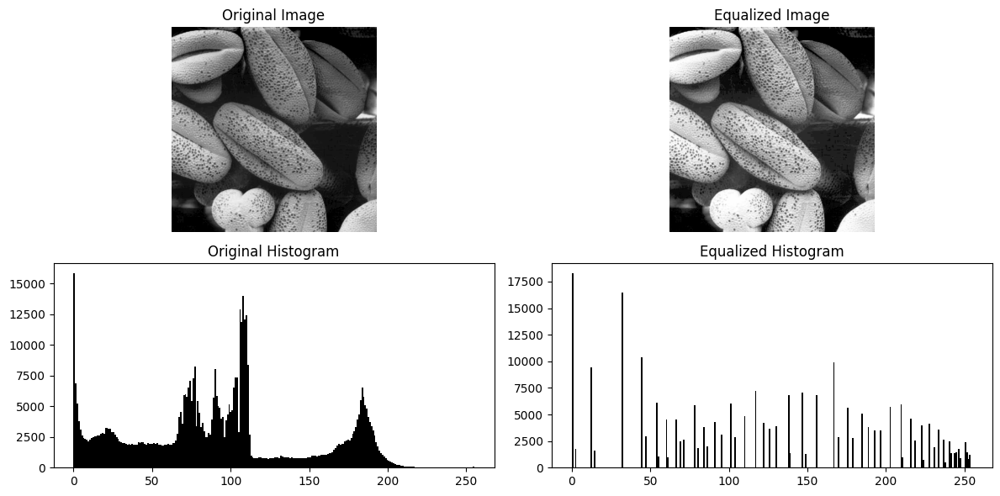

In [23]:
img5 = cv2.imread(r'D:\5th sem\Image proccessing\EN3160-Assignment-1---Intensity-Transformations-and-Neighborhood-Filtering\a1images\shells.tif', 0)

# Apply custom histogram equalization
equalized_img = histogram_equalization(img5)

# Display results
plt.figure(figsize=(12,6))

plt.subplot(2,2,1)
plt.title('Original Image')
plt.imshow(img5, cmap='gray')
plt.axis('off')

plt.subplot(2,2,2)
plt.title('Equalized Image')
plt.imshow(equalized_img, cmap='gray')
plt.axis('off')

plt.subplot(2,2,3)
plt.title('Original Histogram')
plt.hist(img.flatten(), bins=256, range=[0,255], color='black')

plt.subplot(2,2,4)
plt.title('Equalized Histogram')
plt.hist(equalized_img.flatten(), bins=256, range=[0,255], color='black')

plt.tight_layout()
plt.show()

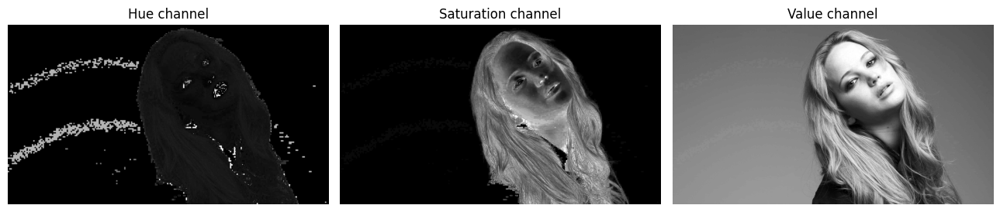

In [24]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Load image
img6 = cv2.imread(r'D:\5th sem\Image proccessing\EN3160-Assignment-1---Intensity-Transformations-and-Neighborhood-Filtering\a1images\jeniffer.jpg')  # replace with actual path

# Convert BGR to HSV
hsv_img = cv2.cvtColor(img6, cv2.COLOR_BGR2HSV)

# Split HSV channels
h, s, v = cv2.split(hsv_img)

# Display HSV channels in grayscale
fig, axes = plt.subplots(1, 3, figsize=(13, 4))
axes[0].imshow(h, cmap='gray')
axes[0].set_title('Hue channel')
axes[0].axis('off')

axes[1].imshow(s, cmap='gray')
axes[1].set_title('Saturation channel')
axes[1].axis('off')

axes[2].imshow(v, cmap='gray')
axes[2].set_title('Value channel')
axes[2].axis('off')

plt.tight_layout()
plt.show()


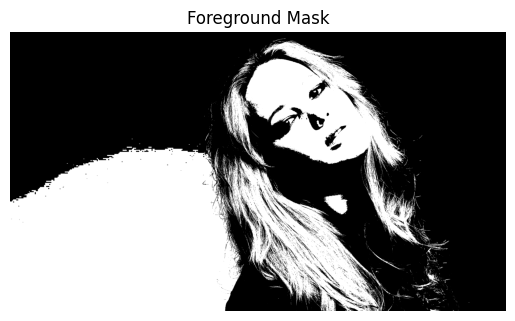

In [31]:
# Threshold the V channel to create a binary foreground mask
_, foreground_mask = cv2.threshold(v, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)

# Display mask
plt.imshow(foreground_mask, cmap='gray')
plt.title('Foreground Mask')
plt.axis('off')
plt.show()

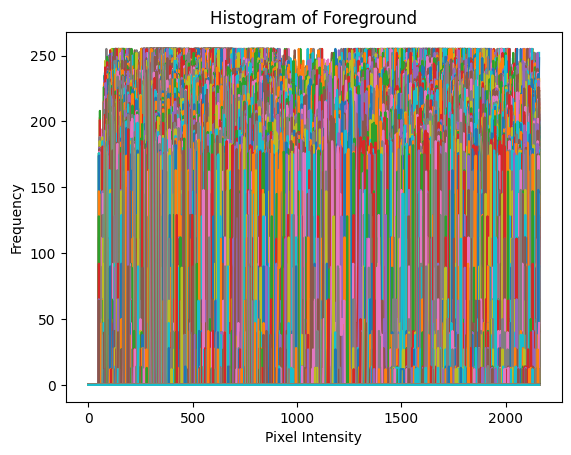

In [36]:
# Extract foreground pixels using the mask
foreground = cv2.bitwise_and(v, v, mask=foreground_mask)

# Compute histogram of foreground pixels (only where mask is white)
hist_foreground = histogram_equalization(foreground)

# Plot histogram
plt.plot(hist_foreground)
plt.title('Histogram of Foreground')
plt.xlabel('Pixel Intensity')
plt.ylabel('Frequency')
plt.show()

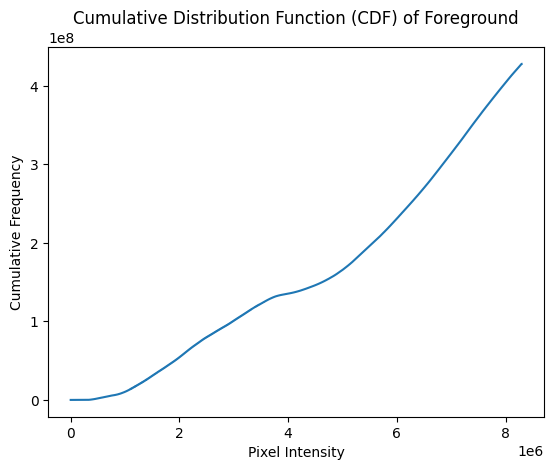

In [33]:
cdf = hist_foreground.cumsum()
plt.plot(cdf)
plt.title('Cumulative Distribution Function (CDF) of Foreground')
plt.xlabel('Pixel Intensity')
plt.ylabel('Cumulative Frequency')
plt.show()

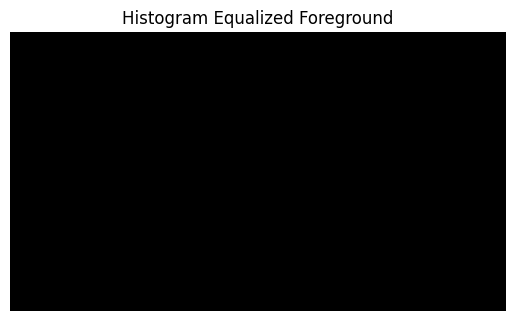

In [37]:
# Mask zeros to avoid divide by zero
cdf_masked = np.ma.masked_equal(cdf, 0)

cdf_min = cdf_masked.min()
total_pixels = cdf_masked.max()

# Normalize CDF
cdf_normalized = (cdf_masked - cdf_min) * 255 / (total_pixels - cdf_min)
cdf_normalized = np.ma.filled(cdf_normalized, 0).astype('uint8')

# Create equalized foreground by mapping pixel values using normalized CDF
foreground_equalized = cdf_normalized[foreground]

# Display equalized foreground
plt.imshow(foreground_equalized, cmap='gray')
plt.title('Histogram Equalized Foreground')
plt.axis('off')
plt.show()

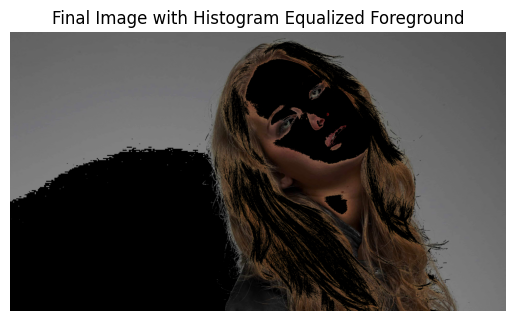

In [38]:
# Create background mask (inverse of foreground mask)
background_mask = cv2.bitwise_not(foreground_mask)

# Extract background from V channel
background = cv2.bitwise_and(v, v, mask=background_mask)

# Combine background and equalized foreground
final_v = cv2.add(background, foreground_equalized)

# Merge with original H and S channels
final_hsv = cv2.merge([h, s, final_v])

# Convert back to BGR to display final image
final_bgr = cv2.cvtColor(final_hsv, cv2.COLOR_HSV2BGR)

# Show final result
plt.imshow(cv2.cvtColor(final_bgr, cv2.COLOR_BGR2RGB))
plt.title('Final Image with Histogram Equalized Foreground')
plt.axis('off')
plt.show()


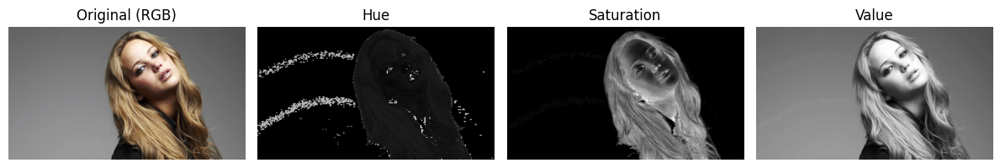

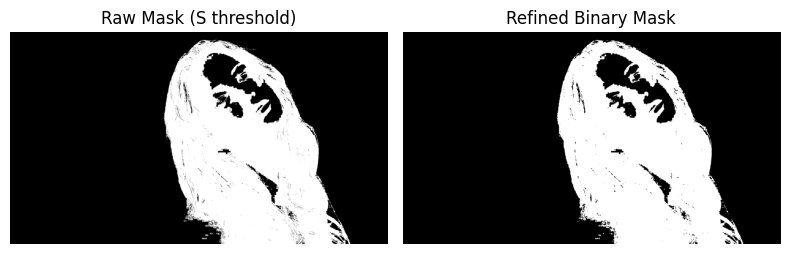

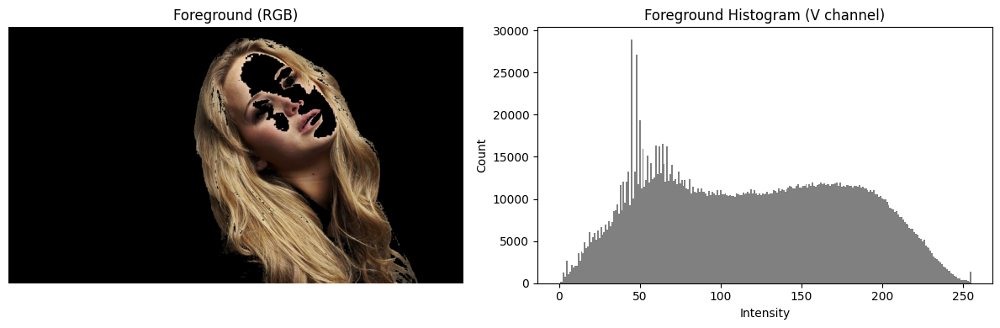

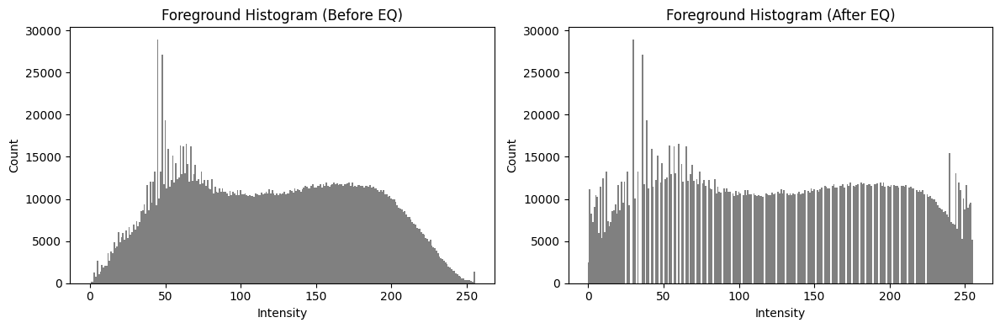

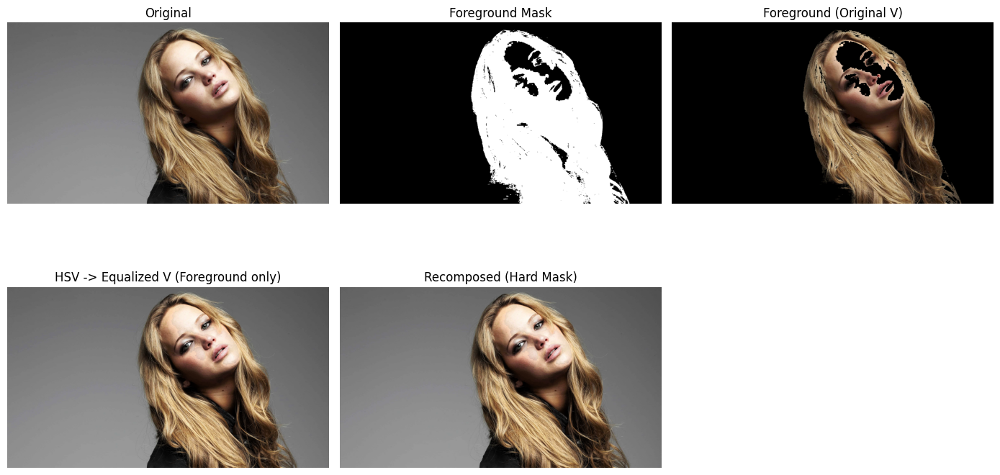

In [59]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# ----------------------------
# (a) Load image and split HSV
# ----------------------------
# Replace with the correct path to "Fig. 6"
img_bgr = cv2.imread(r'D:\5th sem\Image proccessing\EN3160-Assignment-1---Intensity-Transformations-and-Neighborhood-Filtering\a1images\jeniffer.jpg')

img_rgb = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2RGB)
hsv = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2HSV)
h, s, v = cv2.split(hsv)

# Display H, S, V planes in grayscale
plt.figure(figsize=(12,4))
plt.subplot(1,4,1); plt.imshow(img_rgb); plt.title('Original (RGB)'); plt.axis('off')
plt.subplot(1,4,2); plt.imshow(h, cmap='gray'); plt.title('Hue'); plt.axis('off')
plt.subplot(1,4,3); plt.imshow(s, cmap='gray'); plt.title('Saturation'); plt.axis('off')
plt.subplot(1,4,4); plt.imshow(v, cmap='gray'); plt.title('Value'); plt.axis('off')
plt.tight_layout(); plt.show()

# ----------------------------------------------------------------------
# (b) Select appropriate plane and threshold to extract a binary mask
# ----------------------------------------------------------------------
# Guidance:
# - If the foreground is defined by color vividness, threshold Saturation.
# - If the foreground is mainly brighter/darker than background, threshold Value.
# - If the object has a distinct hue, use Hue range with inRange.
#
# Example strategy: try Saturation-based mask, then refine.
# Tune thresholds as needed for your specific Fig. 6.

# Try saturation threshold (keep moderately high saturation as foreground)
s_lower, s_upper = 60, 255
mask_s = cv2.inRange(s, s_lower, s_upper)  # binary mask from S

# Optionally refine using morphology to clean small noise and fill small holes
kernel = np.ones((3,3), np.uint8)
mask_bin = cv2.morphologyEx(mask_s, cv2.MORPH_OPEN, kernel, iterations=1)
mask_bin = cv2.morphologyEx(mask_bin, cv2.MORPH_CLOSE, kernel, iterations=1)

# Ensure a proper binary mask in {0,1} for later math
mask01 = (mask_bin > 0).astype(np.uint8)

plt.figure(figsize=(8,4))
plt.subplot(1,2,1); plt.imshow(mask_s, cmap='gray'); plt.title('Raw Mask (S threshold)'); plt.axis('off')
plt.subplot(1,2,2); plt.imshow(mask_bin, cmap='gray'); plt.title('Refined Binary Mask'); plt.axis('off')
plt.tight_layout(); plt.show()

# ---------------------------------------------------------
# (c) Foreground via bitwise_and and compute the histogram
# ---------------------------------------------------------
# Extract foreground from RGB (visualization) and V (for intensity histogram)
foreground_rgb = cv2.bitwise_and(img_rgb, img_rgb, mask=mask_bin)

# Choose intensity channel to analyze for histogram equalization:
# Typically use the Value (V) channel in HSV for brightness equalization.
foreground_v = cv2.bitwise_and(v, v, mask=mask_bin)

# Compute histogram only over foreground pixels
# Note: foreground_v already zeros out background; we can hist over the non-zero mask
hist_fg, bins = np.histogram(foreground_v[mask01==1], bins=256, range=(0,256))

plt.figure(figsize=(12,4))
plt.subplot(1,2,1); plt.imshow(foreground_rgb); plt.title('Foreground (RGB)'); plt.axis('off')
plt.subplot(1,2,2); 
plt.bar(np.arange(256), hist_fg, width=1.0, color='gray')
plt.title('Foreground Histogram (V channel)')
plt.xlabel('Intensity'); plt.ylabel('Count')
plt.tight_layout(); plt.show()

# -------------------------------------------------------
# (d) Cumulative sum of the histogram using np.cumsum
# -------------------------------------------------------
cdf_fg = np.cumsum(hist_fg)  # length 256
# Normalize CDF to [0, 1]
cdf_min = cdf_fg[np.nonzero(cdf_fg)].min() if np.any(cdf_fg) else 0
N_fg = cdf_fg[-1] if len(cdf_fg) > 0 else 1  # total foreground pixels

# ---------------------------------------------------------------
# (e) Histogram equalization of the foreground using formulas
#     s = round( (cdf(r) - cdf_min) / (N - cdf_min) * (L-1) )
#     where L=256
# ---------------------------------------------------------------
L = 256
# Build mapping for 0..255
# For bins not present (cdf==0), mapping will go to 0; we use cdf_min to avoid flat zero mapping.
equal_map = np.zeros(256, dtype=np.uint8)
if N_fg > 0 and cdf_min < N_fg:
    equal_map = np.round((cdf_fg - cdf_min) / (N_fg - cdf_min) * (L - 1)).clip(0, 255).astype(np.uint8)

# Apply mapping only to foreground pixels on the V channel
v_eq = v.copy()
# Map: for foreground pixels, replace v by equalized value, else keep original v
# To avoid touching background, we only remap at mask==1
v_eq[mask01==1] = equal_map[v[mask01==1]]

# Show before/after V for foreground region
plt.figure(figsize=(12,4))
plt.subplot(1,2,1); 
plt.bar(np.arange(256), hist_fg, width=1.0, color='gray')
plt.title('Foreground Histogram (Before EQ)'); plt.xlabel('Intensity'); plt.ylabel('Count')

# Histogram after equalization for foreground pixels
hist_fg_eq, _ = np.histogram(v_eq[mask01==1], bins=256, range=(0,256))
plt.subplot(1,2,2); 
plt.bar(np.arange(256), hist_fg_eq, width=1.0, color='gray')
plt.title('Foreground Histogram (After EQ)'); plt.xlabel('Intensity'); plt.ylabel('Count')
plt.tight_layout(); plt.show()

# -------------------------------------------------------------------
# (f) Extract the background and add with histogram-equalized foreground
# -------------------------------------------------------------------
# Build new HSV with equalized V for foreground only, H and S unchanged
hsv_eq = hsv.copy()
hsv_eq[..., 2] = v_eq

# Convert back to RGB for visualization
img_eq_rgb = cv2.cvtColor(hsv_eq, cv2.COLOR_HSV2RGB)

# Alternatively, explicitly recomposite using the mask:
# - Foreground from img_eq_rgb (equalized V)
# - Background from original img_rgb (unchanged)
foreground_eq_rgb = (img_eq_rgb * mask01[..., None]).astype(np.uint8)
background_rgb = (img_rgb * (1 - mask01[..., None])).astype(np.uint8)
recomposed_rgb = (foreground_eq_rgb + background_rgb).astype(np.uint8)



# -----------------
# Display results
# -----------------
plt.figure(figsize=(14,8))
plt.subplot(2,3,1); plt.imshow(img_rgb); plt.title('Original'); plt.axis('off')
plt.subplot(2,3,2); plt.imshow(mask_bin, cmap='gray'); plt.title('Foreground Mask'); plt.axis('off')
plt.subplot(2,3,3); plt.imshow(foreground_rgb); plt.title('Foreground (Original V)'); plt.axis('off')
plt.subplot(2,3,4); plt.imshow(img_eq_rgb); plt.title('HSV -> Equalized V (Foreground only)'); plt.axis('off')
plt.subplot(2,3,5); plt.imshow(recomposed_rgb); plt.title('Recomposed (Hard Mask)'); plt.axis('off')
plt.tight_layout(); plt.show()


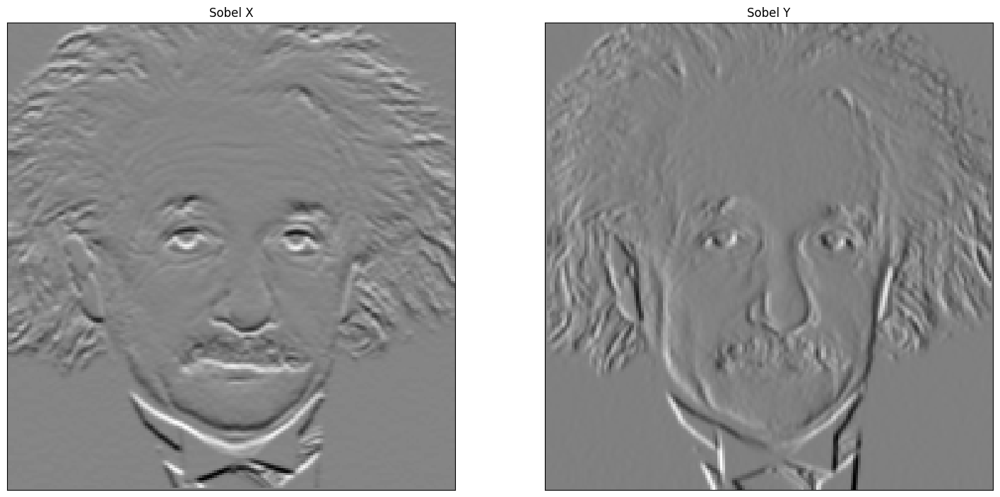

In [ ]:
img7 = cv2.imread(r'D:\5th sem\Image proccessing\EN3160-Assignment-1---Intensity-Transformations-and-Neighborhood-Filtering\a1images\einstein.png', cv2.IMREAD_REDUCED_GRAYSCALE_2)

sobel_x = np.array([[-1, -2, -1], [0, 0, 0], [1, 2, 1]])
sobel_y = np.array([[-1, 0, 1], [-2, 0, 2], [-1, 0, 1]])

im_x = cv2.filter2D(img7, cv2.CV_64F, sobel_x)
im_y = cv2.filter2D(img7, cv2.CV_64F, sobel_y)

fig, ax  = plt.subplots(1,2, sharex='all', sharey='all', figsize=(18,9))
ax[0].imshow(im_x, cmap='gray')
ax[0].set_title('Sobel X')
ax[0].set_xticks([]), ax[0].set_yticks([])
ax[1].imshow(im_y, cmap='gray')
ax[1].set_title('Sobel Y')
ax[1].set_xticks([]), ax[1].set_yticks([])
plt.show()

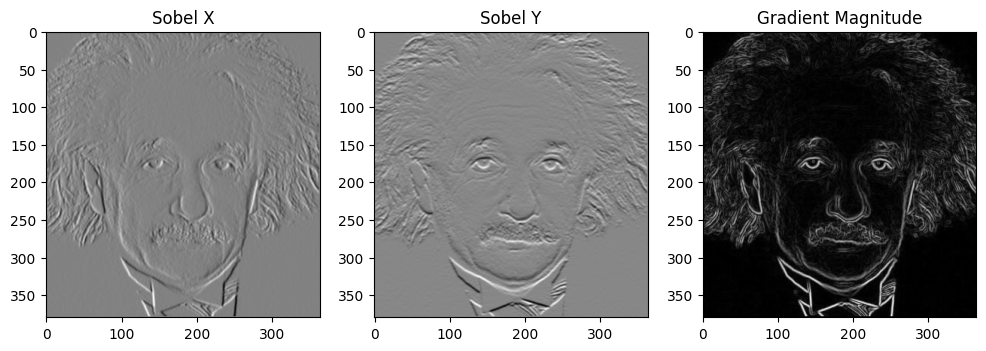

In [44]:
# Define Sobel kernels
Kx = np.array([[-1, 0, 1],
               [-2, 0, 2],
               [-1, 0, 1]], dtype=np.float32)

Ky = np.array([[-1, -2, -1],
               [ 0,  0,  0],
               [ 1,  2,  1]], dtype=np.float32)

# Get image dimensions
rows, cols = img7.shape

# Create empty arrays for gradients
Gx = np.zeros_like(img7, dtype=np.float32)
Gy = np.zeros_like(img7, dtype=np.float32)

# Manual convolution (ignoring borders)
for i in range(1, rows-1):
    for j in range(1, cols-1):
        region = img7[i-1:i+2, j-1:j+2]  # 3x3 neighborhood
        Gx[i, j] = np.sum(Kx * region)
        Gy[i, j] = np.sum(Ky * region)

# Gradient magnitude
G = np.sqrt(Gx**2 + Gy**2)

# Normalize to 0–255
G = (G / G.max()) * 255
G = G.astype(np.uint8)

# Show results
plt.figure(figsize=(12,4))
plt.subplot(1, 3, 1), plt.imshow(Gx, cmap='gray'), plt.title('Sobel X')
plt.subplot(1, 3, 2), plt.imshow(Gy, cmap='gray'), plt.title('Sobel Y')
plt.subplot(1, 3, 3), plt.imshow(G, cmap='gray'), plt.title('Gradient Magnitude')
plt.show()

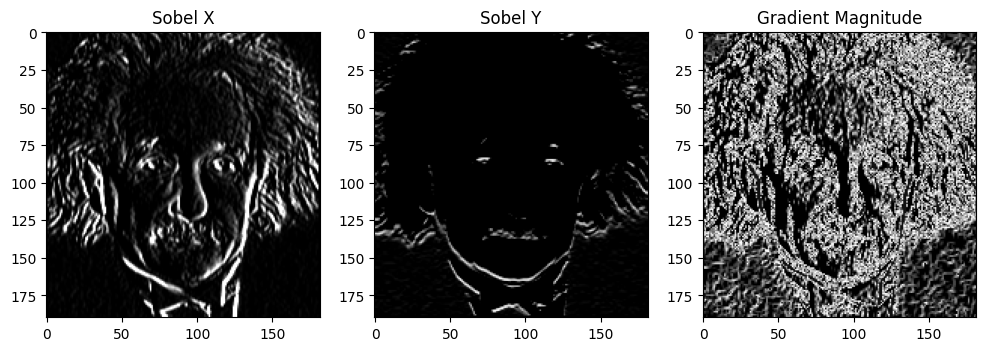

In [13]:
# Sobel X separable filters
col_vec = np.array([[1], [2], [1]], dtype=np.float32)   # vertical
row_vec = np.array([[1, 0, -1]], dtype=np.float32)      # horizontal

# Step 1: Horizontal convolution
temp = cv2.filter2D(img7, -1, row_vec)

# Step 2: Vertical convolution
sobel_x = cv2.filter2D(temp, -1, col_vec)

# Sobel Y separable filters
col_vec_y = np.array([[1], [0], [-1]], dtype=np.float32)  # vertical
row_vec_y = np.array([[1, 2, 1]], dtype=np.float32)       # horizontal

# Step 1: Horizontal convolution
temp_y = cv2.filter2D(img7, -1, row_vec_y)

# Step 2: Vertical convolution
sobel_y = cv2.filter2D(temp_y, -1, col_vec_y)

# Gradient magnitude
gradient_magnitude = np.sqrt(sobel_x**2 + sobel_y**2)
gradient_magnitude = gradient_magnitude.astype(np.uint8)


# Show results
plt.figure(figsize=(12,4))
plt.subplot(1, 3, 1), plt.imshow(sobel_x, cmap='gray'), plt.title('Sobel X')
plt.subplot(1, 3, 2), plt.imshow(sobel_y, cmap='gray'), plt.title('Sobel Y')
plt.subplot(1, 3, 3), plt.imshow(gradient_magnitude, cmap='gray'), plt.title('Gradient Magnitude')
plt.show()

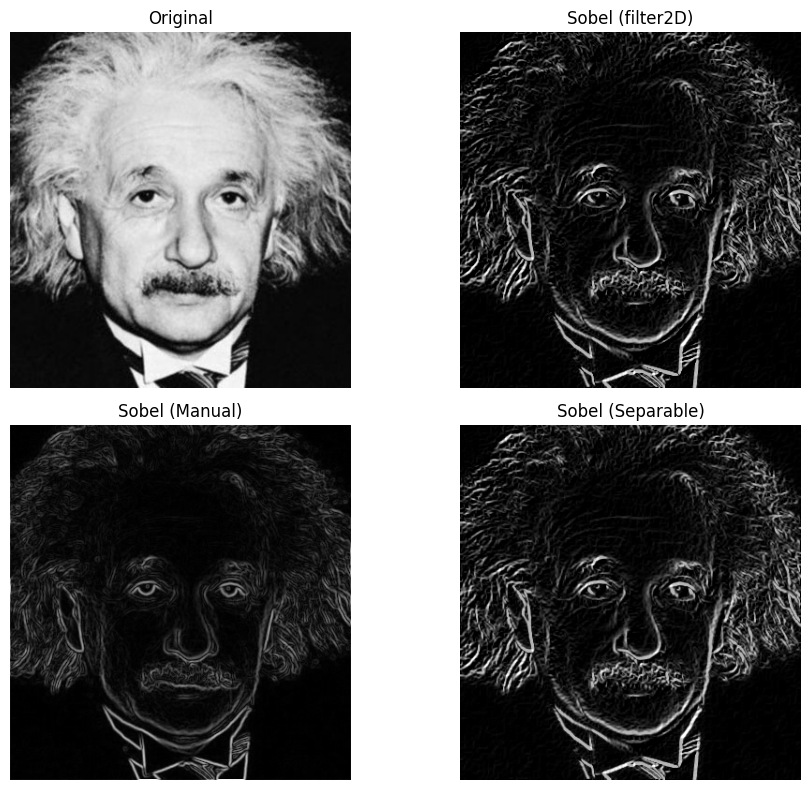

In [43]:
import cv2
import numpy as np
from matplotlib import pyplot as plt

# ---------- (a) Load image ----------
img7 = cv2.imread(r'D:\5th sem\Image proccessing\EN3160-Assignment-1---Intensity-Transformations-and-Neighborhood-Filtering\a1images\einstein.png', cv2.IMREAD_GRAYSCALE)

# ---------- (b) Sobel filter using cv2.filter2D ----------
sobel_x_kernel = np.array([[1, 0, -1],
                           [2, 0, -2],
                           [1, 0, -1]], dtype=np.float32)

sobel_y_kernel = np.array([[1, 2, 1],
                           [0, 0, 0],
                           [-1, -2, -1]], dtype=np.float32)

sobel_x_a = cv2.filter2D(img7, -1, sobel_x_kernel)
sobel_y_a = cv2.filter2D(img7, -1, sobel_y_kernel)
sobel_a = cv2.magnitude(sobel_x_a.astype(np.float32), sobel_y_a.astype(np.float32))

# ---------- (c) Write your own Sobel filter ----------
def my_convolution(image, kernel):
    kh, kw = kernel.shape
    pad_h, pad_w = kh//2, kw//2
    padded = np.pad(image, ((pad_h, pad_h), (pad_w, pad_w)), mode='constant')
    output = np.zeros_like(image, dtype=np.float32)

    for i in range(image.shape[0]):
        for j in range(image.shape[1]):
            region = padded[i:i+kh, j:j+kw]
            output[i, j] = np.sum(region * kernel)
    return output

sobel_x_b = my_convolution(img7, sobel_x_kernel)
sobel_y_b = my_convolution(img7, sobel_y_kernel)
sobel_b = np.sqrt(sobel_x_b**2 + sobel_y_b**2)

# ---------- (d) Separable convolution ----------
gx_row = np.array([[1, 0, -1]], dtype=np.float32)  # horizontal derivative
gx_col = np.array([[1], [2], [1]], dtype=np.float32)  # smoothing vertically

# X-direction
temp_x = cv2.filter2D(img7, -1, gx_row)
sobel_x_c = cv2.filter2D(temp_x, -1, gx_col)

# Y-direction (transpose order)
gy_row = np.array([[1, 2, 1]], dtype=np.float32)
gy_col = np.array([[1], [0], [-1]], dtype=np.float32)

temp_y = cv2.filter2D(img7, -1, gy_col)
sobel_y_c = cv2.filter2D(temp_y, -1, gy_row)

sobel_c = cv2.magnitude(sobel_x_c.astype(np.float32), sobel_y_c.astype(np.float32))

# ---------- Display ----------
titles = ['Original', 'Sobel (filter2D)', 'Sobel (Manual)', 'Sobel (Separable)']
images = [img7, sobel_a, sobel_b, sobel_c]

plt.figure(figsize=(10,8))
for i in range(4):
    plt.subplot(2, 2, i+1)
    plt.imshow(images[i], cmap='gray')
    plt.title(titles[i])
    plt.axis('off')
plt.tight_layout()
plt.show()

Normalized SSD (nearest neighbor): 0.011755842715501785
Normalized SSD (bilinear): 0.009909305721521378


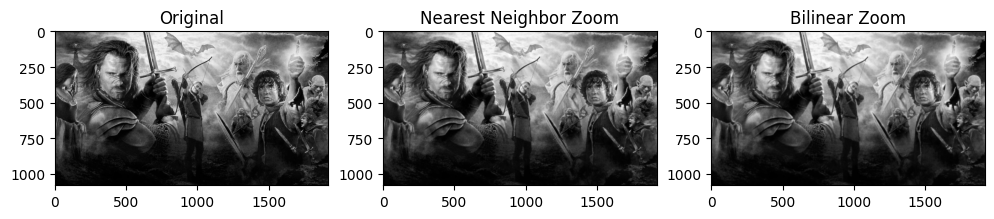

In [45]:
import cv2
import numpy as np

def zoom_image(img, scale_factor, method='nearest'):
    """
    Zooms an image by a given scale factor.
    method: 'nearest' or 'bilinear'
    """
    height, width = img.shape[:2]
    new_height, new_width = int(height * scale_factor), int(width * scale_factor)
    
    if method == 'nearest':
        interp = cv2.INTER_NEAREST
    elif method == 'bilinear':
        interp = cv2.INTER_LINEAR
    else:
        raise ValueError("Method must be 'nearest' or 'bilinear'")
    
    return cv2.resize(img, (new_width, new_height), interpolation=interp)

def normalized_ssd(img1, img2):
    """
    Computes normalized sum of squared differences between two images.
    """
    # Ensure both are float for computation
    img1 = img1.astype(np.float32)
    img2 = img2.astype(np.float32)
    
    ssd = np.sum((img1 - img2) ** 2)
    norm_ssd = ssd / np.sum(img1 ** 2)  # Normalized
    return norm_ssd

# Example usage:
# Load images (original large and zoomed-out small)
original = cv2.imread(r'D:\5th sem\Image proccessing\EN3160-Assignment-1---Intensity-Transformations-and-Neighborhood-Filtering\a1images\a1q5images\im01.png', cv2.IMREAD_GRAYSCALE)
small = cv2.imread(r'D:\5th sem\Image proccessing\EN3160-Assignment-1---Intensity-Transformations-and-Neighborhood-Filtering\a1images\a1q5images\im01small.png', cv2.IMREAD_GRAYSCALE)

# Zoom small image by factor 4 (nearest and bilinear)
factor = 4
zoomed_nearest = zoom_image(small, factor, method='nearest')
zoomed_bilinear = zoom_image(small, factor, method='bilinear')

# Compute normalized SSD
ssd_nearest = normalized_ssd(original, zoomed_nearest)
ssd_bilinear = normalized_ssd(original, zoomed_bilinear)

print(f"Normalized SSD (nearest neighbor): {ssd_nearest}")
print(f"Normalized SSD (bilinear): {ssd_bilinear}")


plt.figure(figsize=(12,4))
plt.subplot(1, 3, 1), plt.imshow(original, cmap='gray'), plt.title('Original')
plt.subplot(1, 3, 2), plt.imshow(zoomed_nearest, cmap='gray'), plt.title('Nearest Neighbor Zoom')
plt.subplot(1, 3, 3), plt.imshow(zoomed_bilinear, cmap='gray'), plt.title('Bilinear Zoom')
plt.show()


Normalized SSD (nearest neighbor): 0.012057948510772873
Normalized SSD (bilinear): 0.010184055645914382


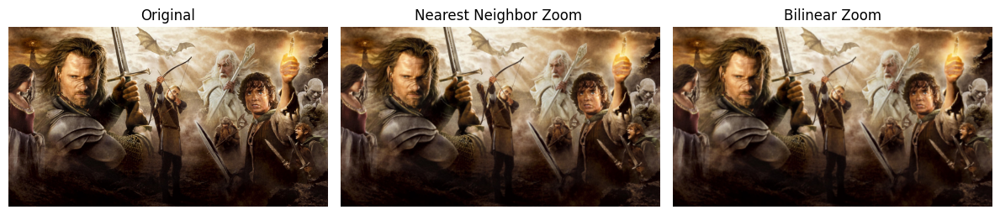

In [52]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

def zoom_image(img, scale_factor, method='nearest'):
    """
    Zooms an image by a given scale factor.
    method: 'nearest' or 'bilinear'
    """
    height, width = img.shape[:2]
    new_height, new_width = int(height * scale_factor), int(width * scale_factor)
    if method == 'nearest':
        interp = cv2.INTER_NEAREST
    elif method == 'bilinear':
        interp = cv2.INTER_LINEAR
    else:
        raise ValueError("Method must be 'nearest' or 'bilinear'")
    return cv2.resize(img, (new_width, new_height), interpolation=interp)

def normalized_ssd(img1, img2):
    """
    Computes normalized sum of squared differences between two color images (BGR).
    If shapes differ, compare over the common overlap region.
    Returns SSD / (sum of squares of img1 over the compared region).
    """
    # Ensure both are float for computation
    img1 = img1.astype(np.float32)
    img2 = img2.astype(np.float32)

    # If different sizes, compute over overlapping region
    h = min(img1.shape[0], img2.shape[0])
    w = min(img1.shape[1], img2.shape[1])
    img1_c = img1[:h, :w]
    img2_c = img2[:h, :w]

    diff = img1_c - img2_c
    ssd = np.sum(diff * diff)
    denom = np.sum(img1_c * img1_c) + 1e-12  # avoid divide-by-zero
    return ssd / denom

# Load images in COLOR (BGR)
original = cv2.imread(r'D:\5th sem\Image proccessing\EN3160-Assignment-1---Intensity-Transformations-and-Neighborhood-Filtering\a1images\a1q5images\im01.png')
small    = cv2.imread(r'D:\5th sem\Image proccessing\EN3160-Assignment-1---Intensity-Transformations-and-Neighborhood-Filtering\a1images\a1q5images\im01small.png')

if original is None or small is None:
    raise FileNotFoundError("Check the image paths.")

# Zoom small image by factor 4 (nearest and bilinear)
factor = 4
zoomed_nearest = zoom_image(small, factor, method='nearest')
zoomed_bilinear = zoom_image(small, factor, method='bilinear')

# Compute normalized SSD on color images
ssd_nearest = normalized_ssd(original, zoomed_nearest)
ssd_bilinear = normalized_ssd(original, zoomed_bilinear)

print(f"Normalized SSD (nearest neighbor): {ssd_nearest}")
print(f"Normalized SSD (bilinear): {ssd_bilinear}")

# Display in COLOR correctly (convert BGR->RGB for matplotlib)
original_rgb = cv2.cvtColor(original, cv2.COLOR_BGR2RGB)
nearest_rgb  = cv2.cvtColor(zoomed_nearest, cv2.COLOR_BGR2RGB)
bilinear_rgb = cv2.cvtColor(zoomed_bilinear, cv2.COLOR_BGR2RGB)

plt.figure(figsize=(12,4))
plt.subplot(1, 3, 1), plt.imshow(original_rgb), plt.title('Original'), plt.axis('off')
plt.subplot(1, 3, 2), plt.imshow(nearest_rgb), plt.title('Nearest Neighbor Zoom '), plt.axis('off')
plt.subplot(1, 3, 3), plt.imshow(bilinear_rgb), plt.title('Bilinear Zoom'), plt.axis('off')
plt.tight_layout()
plt.show()


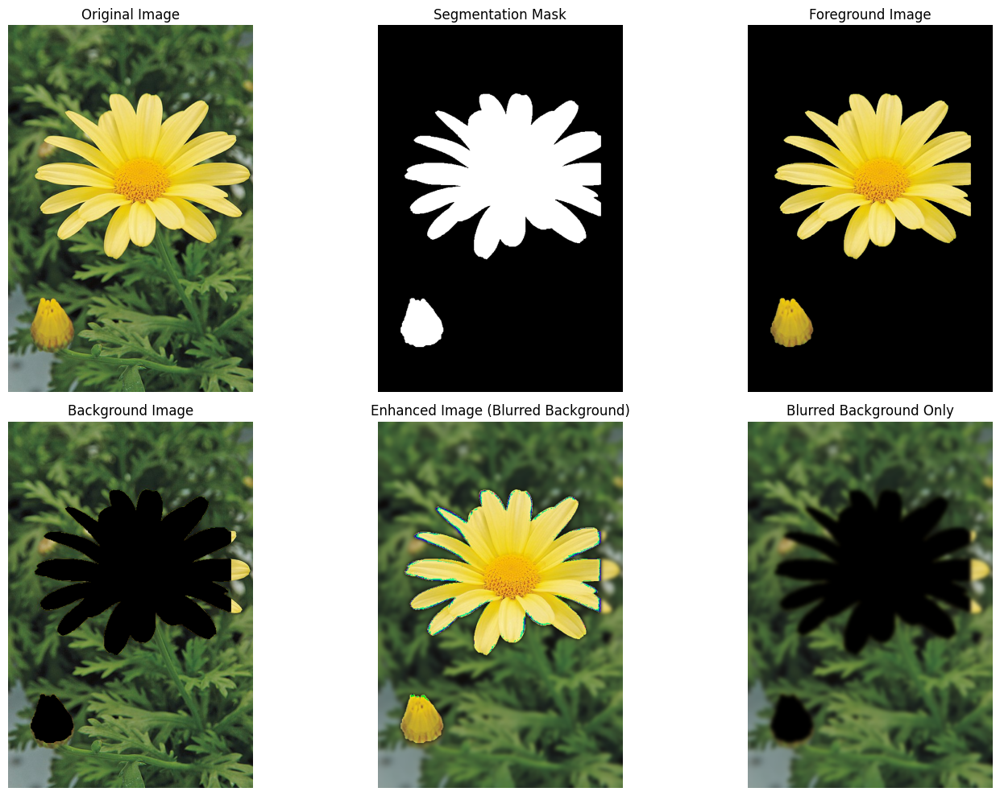

In [5]:
# 1. Load the image
img9 = cv2.imread(r'D:\5th sem\Image proccessing\EN3160-Assignment-1---Intensity-Transformations-and-Neighborhood-Filtering\a1images\daisy.jpg')  # Replace with your image filename
img_rgb = cv2.cvtColor(img9, cv2.COLOR_BGR2RGB)

# 2. Initialize mask and models
mask = np.zeros(img9.shape[:2], np.uint8)  # 0: background, 1: foreground, 2/3: probable
bgdModel = np.zeros((1, 65), np.float64)
fgdModel = np.zeros((1, 65), np.float64)

# 3. Define a rectangle around the object (manually adjust coordinates)
rect = (50, 50, img9.shape[1] - 100, img9.shape[0] - 100)  # (x, y, width, height)

# 4. Apply GrabCut
cv2.grabCut(img_rgb, mask, rect, bgdModel, fgdModel, 5, cv2.GC_INIT_WITH_RECT)

# 5. Create masks
# 0 & 2 = background, 1 & 3 = foreground
mask2 = np.where((mask == 2) | (mask == 0), 0, 1).astype("uint8")

# Foreground image
foreground = img_rgb * mask2[:, :, np.newaxis]

# Background image
background = img_rgb * (1 - mask2)[:, :, np.newaxis]

# 6. Blur background for enhancement
blurred_bg = cv2.GaussianBlur(background, (25, 25), 0)
enhanced_img = blurred_bg + foreground

# 7. Show results
fig, axes = plt.subplots(2, 3, figsize=(15, 10))

axes[0, 0].imshow(img_rgb)
axes[0, 0].set_title("Original Image")
axes[0, 0].axis("off")

axes[0, 1].imshow(mask2, cmap="gray")
axes[0, 1].set_title("Segmentation Mask")
axes[0, 1].axis("off")

axes[0, 2].imshow(foreground)
axes[0, 2].set_title("Foreground Image")
axes[0, 2].axis("off")

axes[1, 0].imshow(background)
axes[1, 0].set_title("Background Image")
axes[1, 0].axis("off")

axes[1, 1].imshow(enhanced_img)
axes[1, 1].set_title("Enhanced Image (Blurred Background)")
axes[1, 1].axis("off")

axes[1, 2].imshow(blurred_bg)
axes[1, 2].set_title("Blurred Background Only")
axes[1, 2].axis("off")

plt.tight_layout()
plt.show()

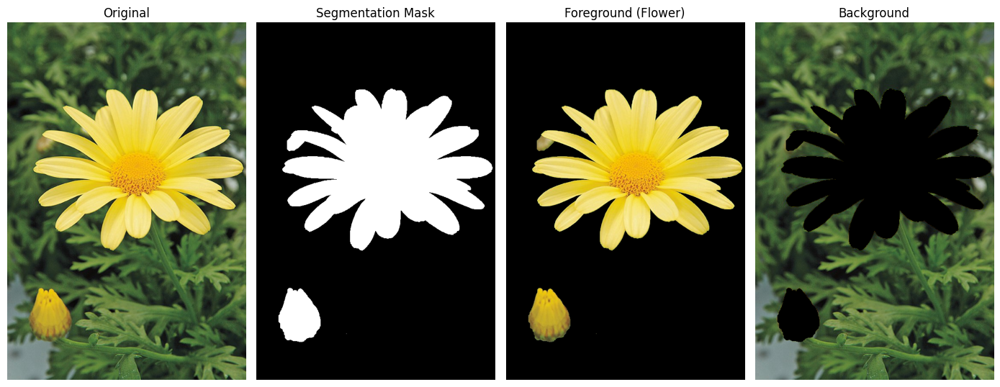

In [53]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# ---- Load the image (replace with your path) ----
img_bgr = cv2.imread(r'D:\5th sem\Image proccessing\EN3160-Assignment-1---Intensity-Transformations-and-Neighborhood-Filtering\a1images\daisy.jpg')
if img_bgr is None:
    raise FileNotFoundError("Image not found. Check the file path.")
img_rgb = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2RGB)
h_, w_ = img_rgb.shape[:2]

# ---- Initial rectangle covering the flower (tune if needed) ----
rect = (int(0.1*w_), int(0.1*h_), int(0.8*w_), int(0.8*h_))

# ---- Run GrabCut with rectangle initialization ----
mask = np.zeros(img_rgb.shape[:2], np.uint8)
bgdModel = np.zeros((1, 65), np.float64)
fgdModel = np.zeros((1, 65), np.float64)

cv2.grabCut(img_bgr, mask, rect, bgdModel, fgdModel, 5, cv2.GC_INIT_WITH_RECT)

# ---- Optional color-based refinement for yellow petals ----
# Convert to HSV and build a "yellow" mask to bias petals as probable foreground
hsv = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2HSV)
# Yellow ranges can vary; try a broad range then refine if needed
lower_yellow1 = np.array([15, 60, 80])   # H,S,V
upper_yellow1 = np.array([35, 255, 255])
yellow_mask = cv2.inRange(hsv, lower_yellow1, upper_yellow1)

# Mark yellow-ish pixels as probable foreground in GrabCut mask
# GrabCut classes: 0=bg, 1=fg, 2=prob_bg, 3=prob_fg
mask_refined = mask.copy()
mask_refined[yellow_mask > 0] = np.where(mask_refined[yellow_mask > 0] == 0, 3, mask_refined[yellow_mask > 0])

# Run GrabCut again using mask initialization to refine
cv2.grabCut(img_bgr, mask_refined, None, bgdModel, fgdModel, 5, cv2.GC_INIT_WITH_MASK)

# ---- Final hard mask: foreground = 1 or 3, background = 0 or 2 ----
final_mask = np.where((mask_refined == 1) | (mask_refined == 3), 1, 0).astype(np.uint8)

# ---- Extract foreground and background (RGB for display) ----
foreground = (img_rgb * final_mask[..., None]).astype(np.uint8)
background = (img_rgb * (1 - final_mask[..., None])).astype(np.uint8)

# ---- Display original, mask, foreground, background ----
plt.figure(figsize=(14, 6))
plt.subplot(1, 4, 1); plt.imshow(img_rgb); plt.title('Original'); plt.axis('off')
plt.subplot(1, 4, 2); plt.imshow(final_mask*255, cmap='gray'); plt.title('Segmentation Mask'); plt.axis('off')
plt.subplot(1, 4, 3); plt.imshow(foreground); plt.title('Foreground (Flower)'); plt.axis('off')
plt.subplot(1, 4, 4); plt.imshow(background); plt.title('Background'); plt.axis('off')
plt.tight_layout(); plt.show()


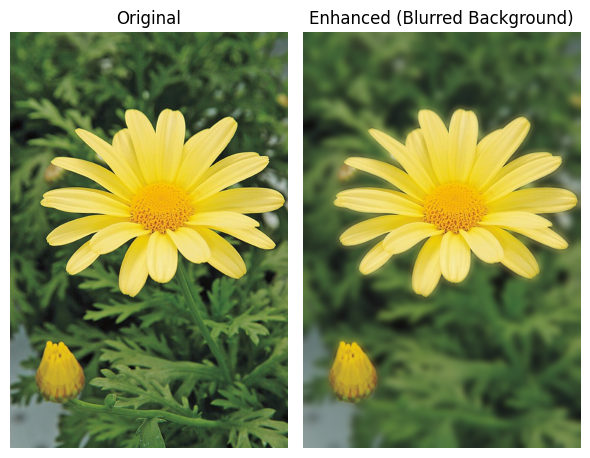

In [57]:
def feather_mask(binary_mask, feather_px=5):
    # Feather/soften edges by Gaussian blur on a float mask
    m = binary_mask.astype(np.float32)
    m = cv2.GaussianBlur(m, (2*feather_px+1, 2*feather_px+1), feather_px)
    m = np.clip(m, 0, 1)
    return m

# Create a strongly blurred version
blur_ksize = 41  # strong blur; must be odd
blur_sigma = 0
blurred_bgr = cv2.GaussianBlur(img_bgr, (blur_ksize, blur_ksize), blur_sigma)
blurred_rgb = cv2.cvtColor(blurred_bgr, cv2.COLOR_BGR2RGB)

# Feather the mask for smoother compositing
soft_mask = feather_mask(final_mask, feather_px=5)[..., None]  # HxWx1

# Composite: keep foreground sharp, background blurred
enhanced_rgb = (img_rgb.astype(np.float32) * soft_mask + blurred_rgb.astype(np.float32) * (1 - soft_mask)).astype(np.uint8)

# Show side-by-side
plt.figure(figsize=(6, 5))
plt.subplot(1, 2, 1); plt.imshow(img_rgb); plt.title('Original'); plt.axis('off')
plt.subplot(1, 2, 2); plt.imshow(enhanced_rgb); plt.title('Enhanced (Blurred Background)'); plt.axis('off')
plt.tight_layout(); plt.show()
